# HW1 : Image Demosaicing and Image Operations

This assignment is a warm-up assignment. We will try to provide you an iPython Notebook (like this) for all the future assignments! The notebook will provide you some further instructions(implementation related mainly), in addition to the ones provided on class webpage.

### Import statements

The following cell is only for import statements. You can use any of the 3 : cv2, matplotlib or skimage for image i/o and other functions. We will provide you the names of the relevant functions for each module. __{For convenience provided at the end of the class assignment webpage}__

In [2]:
import numpy as np
import cv2
import matplotlib
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import skimage
import scipy
from scipy import ndimage
from scipy import signal
%matplotlib inline

### Reading the Mosaic Image

In [13]:
IMG_DIR = 'images/'
IMG_NAME = 'crayons.bmp'

In [3]:
def read_image(IMG_NAME):
    img = mpimg.imread(IMG_NAME)
    return img

crayons.bmp


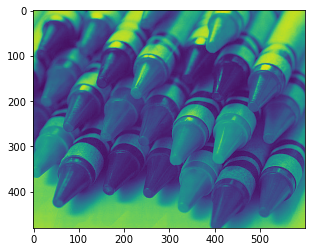

In [15]:
# For a sanity check, display your image here
print(IMG_NAME)
mosaic_img = read_image(IMG_DIR+IMG_NAME)
plt.imshow(mosaic_img)

### Linear Interpolation

In [16]:
### HINT : You might want to use filters

In [17]:
### HINT : To use filters you might want to write your kernels

In [18]:
### HINT : For writing your kernels you might want to see the RGB Pattern provided on the website

In [19]:
### HINT : To improve your kernels, you might want to use the squared difference 
###        between your solution image and the original image

In [20]:
def get_solution_image(mosaic_img):
    '''
    This function should return the soln image.
    Feel free to write helper functions in the above cells
    as well as change the parameters of this function.
    '''
    mosaic_shape = np.shape(mosaic_img)
    soln_image = np.zeros((mosaic_shape[0], mosaic_shape[1], 3))
    ### YOUR CODE HERE ###
    
    mosaic_img = mosaic_img/255
    
    #defining 4 kernels for different averaging scenarios
    k1 = np.array([
         [0.25, 0.00, 0.25],
         [0.00, 0.00, 0.00],
         [0.25, 0.00, 0.25],
         ])
    k2 = np.array([
         [0.00, 0.25, 0.00],
         [0.25, 0.00, 0.25],
         [0.00, 0.25, 0.00],
         ])
    k3 = np.array([
         [0.00, 0.50, 0.00],
         [0.00, 0.00, 0.00],
         [0.00, 0.50, 0.00],
         ])
    k4 = np.array([
         [0.00, 0.00, 0.00],
         [0.50, 0.00, 0.50],
         [0.00, 0.00, 0.00],
         ])


    #convolving input mosaic with 4 kernels
    I1 = scipy.ndimage.convolve(mosaic_img, k1, mode='constant', cval=0)
    I2 = scipy.ndimage.convolve(mosaic_img, k2, mode='constant', cval=0)
    I3 = scipy.ndimage.convolve(mosaic_img, k3, mode='constant', cval=0)
    I4 = scipy.ndimage.convolve(mosaic_img, k4, mode='constant', cval=0)
    
    #building red channel
    soln_image[0:soln_image.shape[0]:2,0:soln_image.shape[1]:2,0] = mosaic_img[0:soln_image.shape[0]:2,0:soln_image.shape[1]:2]
    soln_image[0:soln_image.shape[0]:2,1:soln_image.shape[1]:2,0] = I4[0:soln_image.shape[0]:2,1:soln_image.shape[1]:2]
    soln_image[1:soln_image.shape[0]:2,0:soln_image.shape[1]:2,0] = I3[1:soln_image.shape[0]:2,0:soln_image.shape[1]:2]
    soln_image[1:soln_image.shape[0]:2,1:soln_image.shape[1]:2,0] = I1[1:soln_image.shape[0]:2,1:soln_image.shape[1]:2]
    #building green channel
    soln_image[0:soln_image.shape[0]:2,1:soln_image.shape[1]:2,1] = mosaic_img[0:soln_image.shape[0]:2,1:soln_image.shape[1]:2]
    soln_image[1:soln_image.shape[0]:2,0:soln_image.shape[1]:2,1] = mosaic_img[1:soln_image.shape[0]:2,0:soln_image.shape[1]:2]
    soln_image[0:soln_image.shape[0]:2,0:soln_image.shape[1]:2,1] = I2[0:soln_image.shape[0]:2,0:soln_image.shape[1]:2]
    soln_image[1:soln_image.shape[0]:2,1:soln_image.shape[1]:2,1] = I2[1:soln_image.shape[0]:2,1:soln_image.shape[1]:2]
    #building blue channel
    soln_image[1:soln_image.shape[0]:2,1:soln_image.shape[1]:2,2] = mosaic_img[1:soln_image.shape[0]:2,1:soln_image.shape[1]:2]
    soln_image[1:soln_image.shape[0]:2,0:soln_image.shape[1]:2,2] = I4[1:soln_image.shape[0]:2,0:soln_image.shape[1]:2]
    soln_image[0:soln_image.shape[0]:2,1:soln_image.shape[1]:2,2] = I3[0:soln_image.shape[0]:2,1:soln_image.shape[1]:2]
    soln_image[0:soln_image.shape[0]:2,0:soln_image.shape[1]:2,2] = I1[0:soln_image.shape[0]:2,0:soln_image.shape[1]:2]
    
    return soln_image

In [77]:
def compute_errors(soln_image, original_image):
    '''
    Compute the Average and Maximum per-pixel error
    for the image.
    
    Also generate the map of pixel differences
    to visualize where the mistakes are made
    '''
    original_image = original_image/255
    
    err = np.sum((original_image-soln_image)**2,2)
    pp_err = np.average(err)
    max_err = np.max(err)
    err = err-np.min(err)
    err = err/np.max(err)
    
    fig=plt.figure(figsize=[3,3],dpi=300)
    plt.imshow(err, cmap='gray')
    plt.axis('off')
    plt.title('Map of Pixel Differences')
    fig.savefig('err.svg',format='svg')
    
    return pp_err, max_err

We provide you with 3 images to test if your solution works. Once it works, you should generate the solution for test image provided to you.

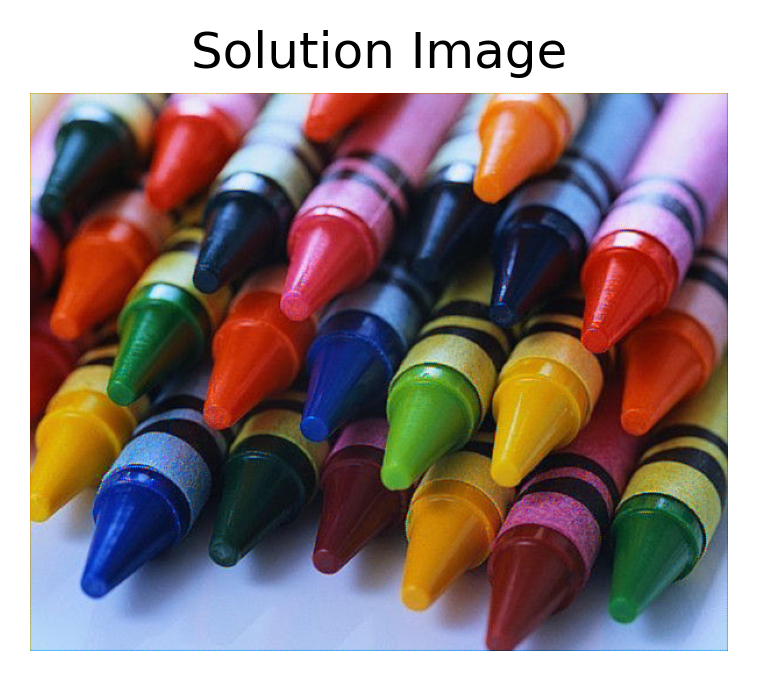

In [76]:
mosaic_img = read_image('images/crayons.bmp')
soln_image = get_solution_image(mosaic_img)
original_image = read_image('images/crayons.jpg')
# For sanity check display your solution image here
### YOUR CODE

fig=plt.figure(figsize=[3,3],dpi=300)
plt.axis('off')
plt.title('Solution Image')
plt.imshow(soln_image)
fig.savefig('p1_2_1.svg',format='svg')

The average per-pixel error for crayons is: 0.00325958382726729
The maximum per-pixel error for crayons is: 0.8224240676662822


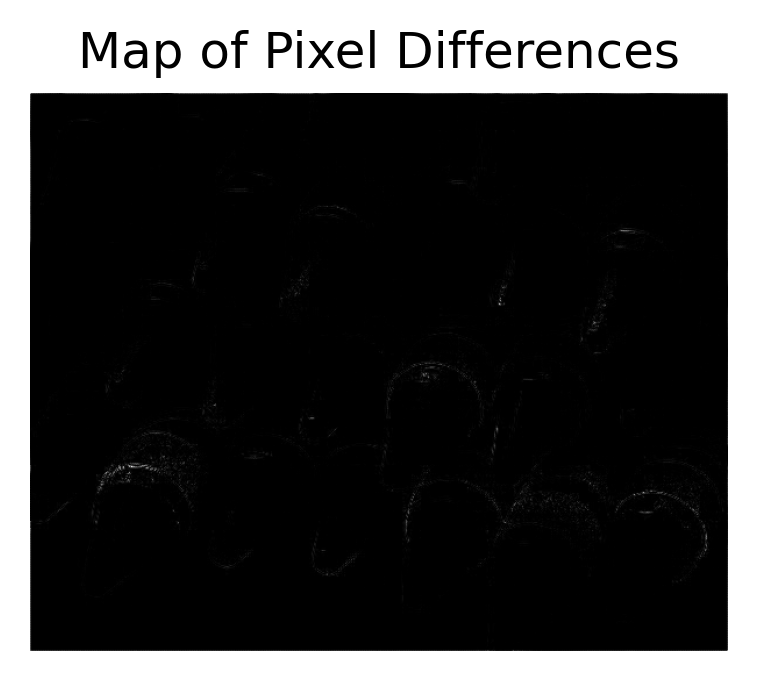

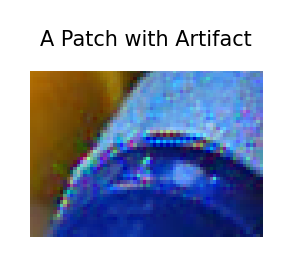

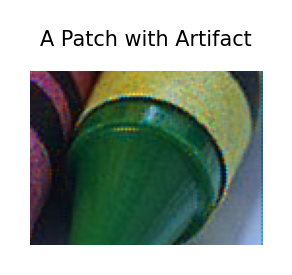

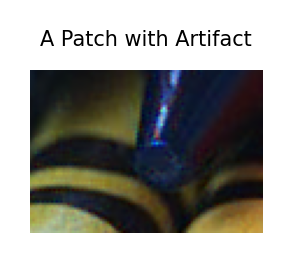

In [78]:
pp_err, max_err = compute_errors(soln_image, original_image)
print("The average per-pixel error for crayons is: "+str(pp_err))
print("The maximum per-pixel error for crayons is: "+str(max_err))

fig1=plt.figure(figsize=[1,1],dpi=300)
plt.axis('off')
plt.title('A Patch with Artifact', fontsize=5)
plt.imshow(soln_image[300:350,50:120])
fig1.savefig('p1_3_1.svg',format='svg')


fig2=plt.figure(figsize=[1,1],dpi=300)
plt.axis('off')
plt.title('A Patch with Artifact', fontsize=5)
plt.imshow(soln_image[330:420,480:600])
fig2.savefig('p1_3_2.svg',format='svg')

fig3=plt.figure(figsize=[1,1],dpi=300)
plt.axis('off')
plt.title('A Patch with Artifact', fontsize=5)
plt.imshow(soln_image[150:220,350:450])
fig3.savefig('p1_3_3.svg',format='svg')

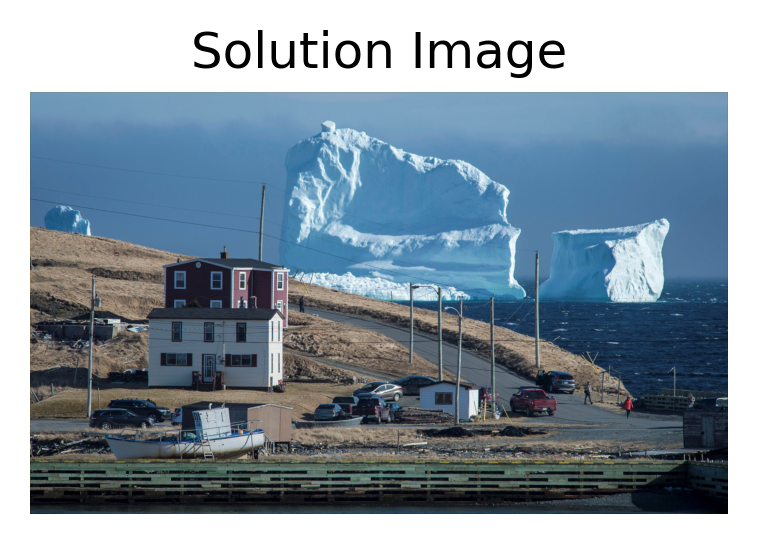

In [51]:
mosaic_img = read_image('images/iceberg.bmp')
soln_image = get_solution_image(mosaic_img)
original_image = read_image('images/iceberg.jpg')
# For sanity check display your solution image here
### YOUR CODE

fig=plt.figure(figsize=[3,3],dpi=300)
plt.axis('off')
plt.title('Solution Image')
plt.imshow(soln_image)
fig.savefig('p1_2_2.svg',format='svg')

The average per-pixel error for iceberg is: 0.0017616646902807334
The maximum per-pixel error for iceberg is: 0.4664600153787005


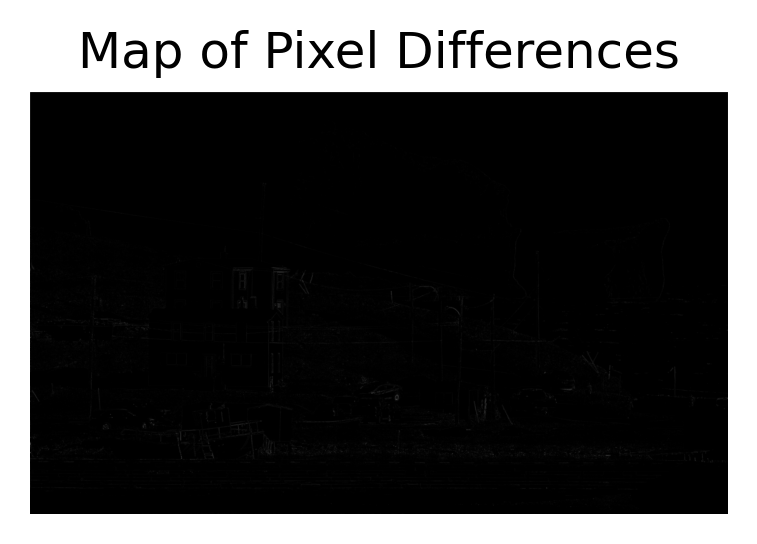

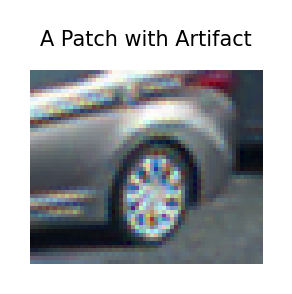

In [52]:
pp_err, max_err = compute_errors(soln_image, original_image)
print("The average per-pixel error for iceberg is: "+str(pp_err))
print("The maximum per-pixel error for iceberg is: "+str(max_err))

fig1=plt.figure(figsize=[1,1],dpi=300)
plt.axis('off')
plt.title('A Patch with Artifact', fontsize=5)
plt.imshow(soln_image[1010:1060,1220:1280])
fig1.savefig('p1_3_4.svg',format='svg')

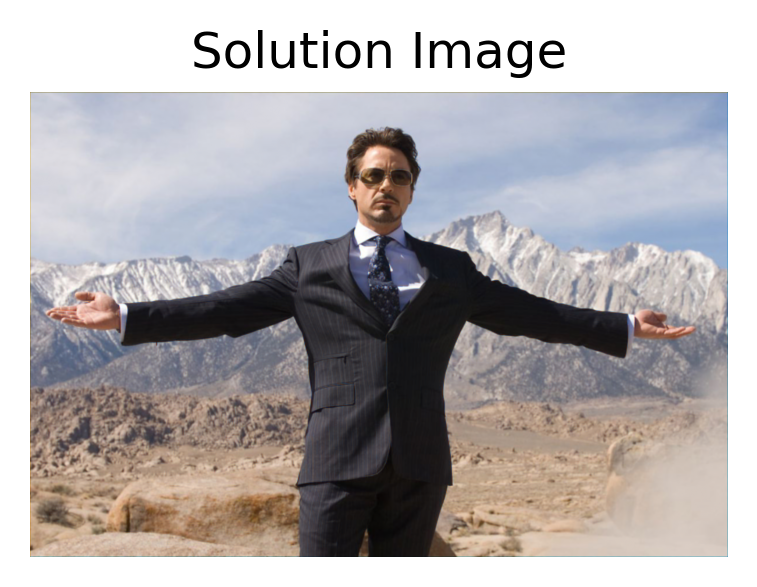

In [48]:
mosaic_img = read_image('images/tony.bmp')
soln_image = get_solution_image(mosaic_img)
original_image = read_image('images/tony.jpg')
# For sanity check display your solution image here
### YOUR CODE

fig=plt.figure(figsize=[3,3],dpi=300)
plt.imshow(soln_image)
plt.axis('off')
plt.title('Solution Image')
fig.savefig('p1_2_3.svg',format='svg')

The average per-pixel error for tony is: 0.000885746795102845
The maximum per-pixel error for tony is: 0.5673442906574394


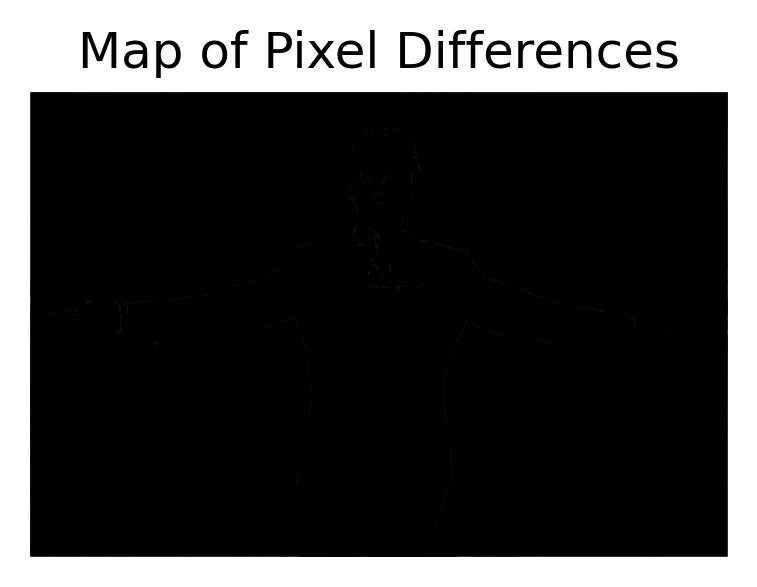

In [28]:
pp_err, max_err = compute_errors(soln_image, original_image)
print("The average per-pixel error for tony is: "+str(pp_err))
print("The maximum per-pixel error for tony is: "+str(max_err))

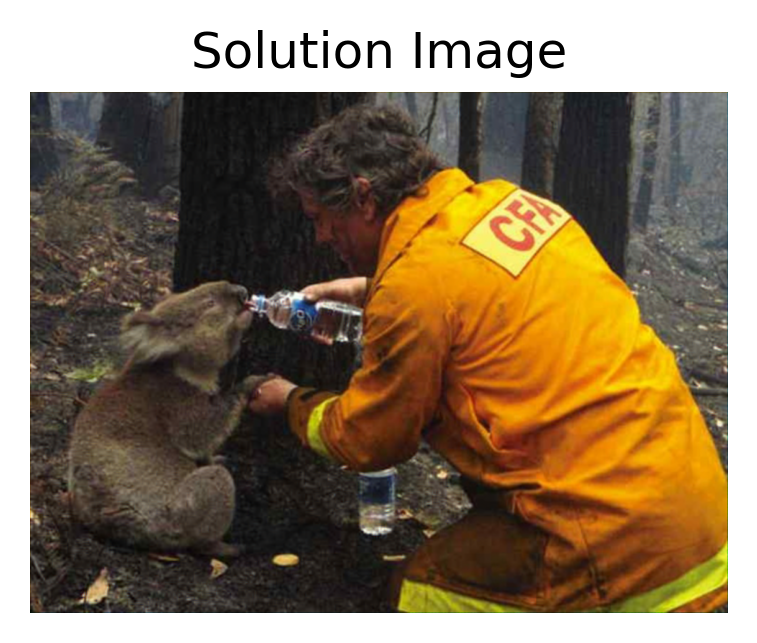

In [44]:
mosaic_img = read_image('images/hope.bmp')
soln_image = get_solution_image(mosaic_img)
# Generate your solution image here and show it 

fig=plt.figure(figsize=[3,3],dpi=300)
plt.axis('off')
plt.title('Solution Image')
plt.imshow(soln_image)
fig.savefig('p1_1.svg',format='svg')

### Freeman's Method

For details of the freeman's method refer to the class assignment webpage.

__MAKE SURE YOU FINISH LINEAR INTERPOLATION BEFORE STARTING THIS PART!!!__

In [30]:
def get_freeman_solution_image(mosaic_img):
    '''
    This function should return the freeman soln image.
    Feel free to write helper functions in the above cells
    as well as change the parameters of this function.
    
    HINT : Use the above get_solution_image function.
    '''
    ### YOUR CODE HERE ###
    
    #simple interpolation
    freeman_soln_image = get_solution_image(mosaic_img)
    #subtracting channel G from channels R and B
    freeman_soln_image[:,:,0] = freeman_soln_image[:,:,0] - freeman_soln_image[:,:,1]
    freeman_soln_image[:,:,2] = freeman_soln_image[:,:,2] - freeman_soln_image[:,:,1]
    #median filtering new channels R and B
    freeman_soln_image[:,:,0] = scipy.signal.medfilt2d(freeman_soln_image[:,:,0])
    freeman_soln_image[:,:,2] = scipy.signal.medfilt2d(freeman_soln_image[:,:,2])
    #adding chanel G to filtered channels R and B
    freeman_soln_image[:,:,0] = freeman_soln_image[:,:,0] + freeman_soln_image[:,:,1]
    freeman_soln_image[:,:,2] = freeman_soln_image[:,:,2] + freeman_soln_image[:,:,1]
    #clipping
    freeman_soln_image[freeman_soln_image<0] = 0    
    freeman_soln_image[freeman_soln_image>1] = 1    
    
    return freeman_soln_image

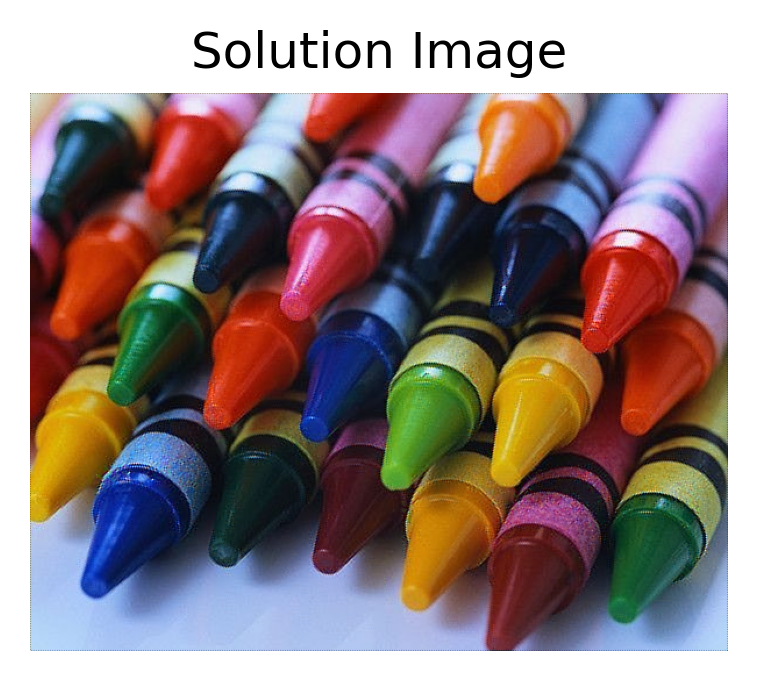

In [65]:
mosaic_img = read_image('images/crayons.bmp')
soln_image = get_freeman_solution_image(mosaic_img)
original_image = read_image('images/crayons.jpg')
# For sanity check display your solution image here
### YOUR CODE

fig=plt.figure(figsize=[3,3],dpi=300)
plt.imshow(soln_image)
plt.axis('off')
plt.title('Solution Image')
fig.savefig('p2_6_1.svg',format='svg')

The average per-pixel error for tony is: 0.002174524748761161
The maximum per-pixel error for tony is: 0.7359880815071126


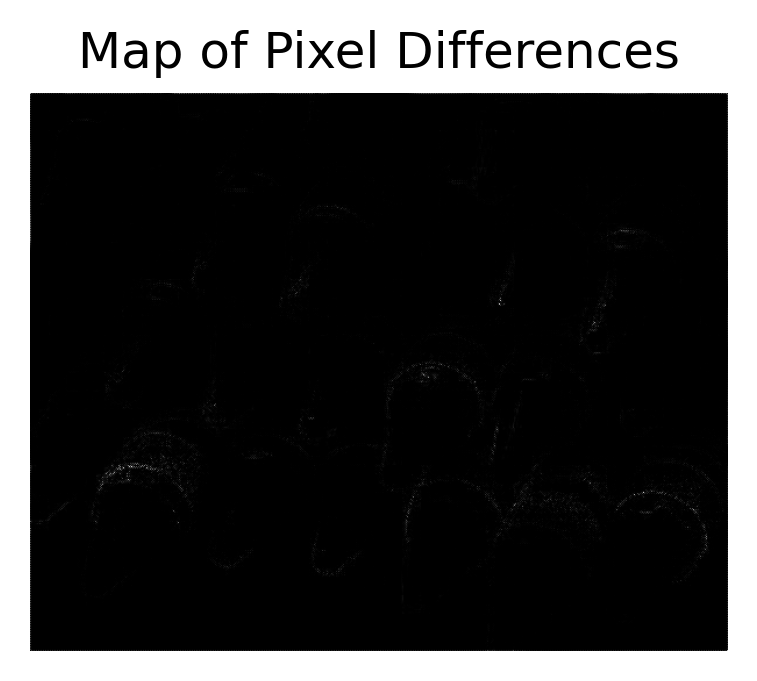

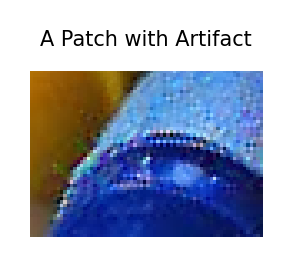

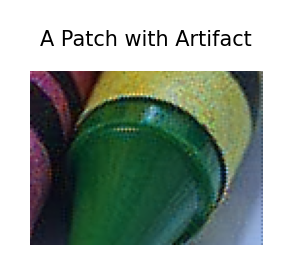

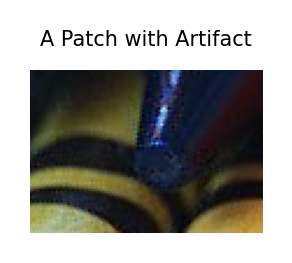

In [66]:
pp_err, max_err = compute_errors(soln_image, original_image)
print("The average per-pixel error for tony is: "+str(pp_err))
print("The maximum per-pixel error for tony is: "+str(max_err))

fig1=plt.figure(figsize=[1,1],dpi=300)
plt.axis('off')
plt.title('A Patch with Artifact', fontsize=5)
plt.imshow(soln_image[300:350,50:120])
fig1.savefig('p2_7_1.svg',format='svg')


fig2=plt.figure(figsize=[1,1],dpi=300)
plt.axis('off')
plt.title('A Patch with Artifact', fontsize=5)
plt.imshow(soln_image[330:420,480:600])
fig2.savefig('p2_7_2.svg',format='svg')

fig3=plt.figure(figsize=[1,1],dpi=300)
plt.axis('off')
plt.title('A Patch with Artifact', fontsize=5)
plt.imshow(soln_image[150:220,350:450])
fig3.savefig('p2_7_3.svg',format='svg')

In [35]:
### Feel free to play around with other images for Freeman's method above ###

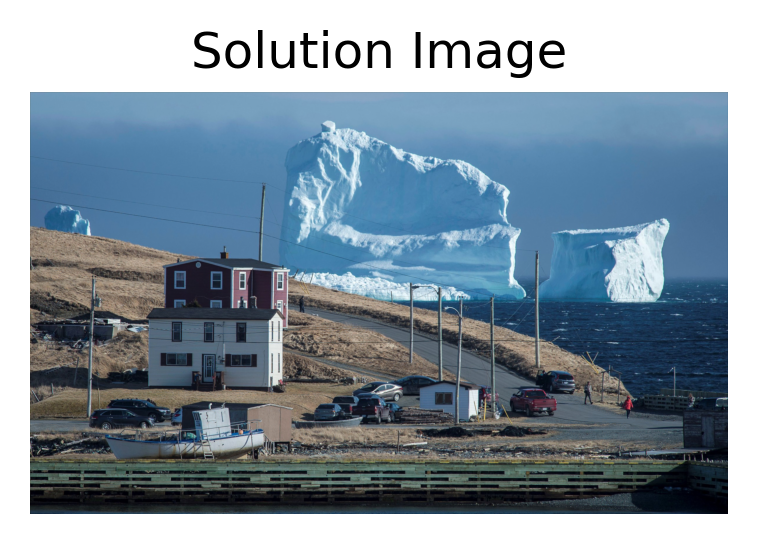

In [60]:
mosaic_img = read_image('images/iceberg.bmp')
soln_image = get_freeman_solution_image(mosaic_img)
original_image = read_image('images/iceberg.jpg')
# For sanity check display your solution image here
### YOUR CODE

fig=plt.figure(figsize=[3,3],dpi=300)
plt.imshow(soln_image)
plt.axis('off')
plt.title('Solution Image')
fig.savefig('p2_6_2.svg',format='svg')

The average per-pixel error for iceberg is: 0.0011216040437609866
The maximum per-pixel error for iceberg is: 0.5204084967320263


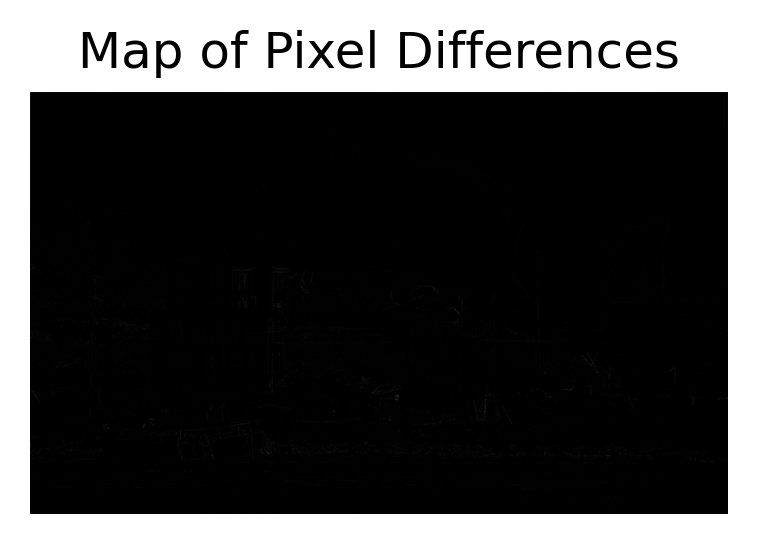

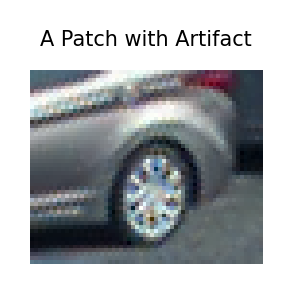

In [62]:
pp_err, max_err = compute_errors(soln_image, original_image)
print("The average per-pixel error for iceberg is: "+str(pp_err))
print("The maximum per-pixel error for iceberg is: "+str(max_err))

fig1=plt.figure(figsize=[1,1],dpi=300)
plt.axis('off')
plt.title('A Patch with Artifact', fontsize=5)
plt.imshow(soln_image[1010:1060,1220:1280])
fig1.savefig('p2_7_4.svg',format='svg')

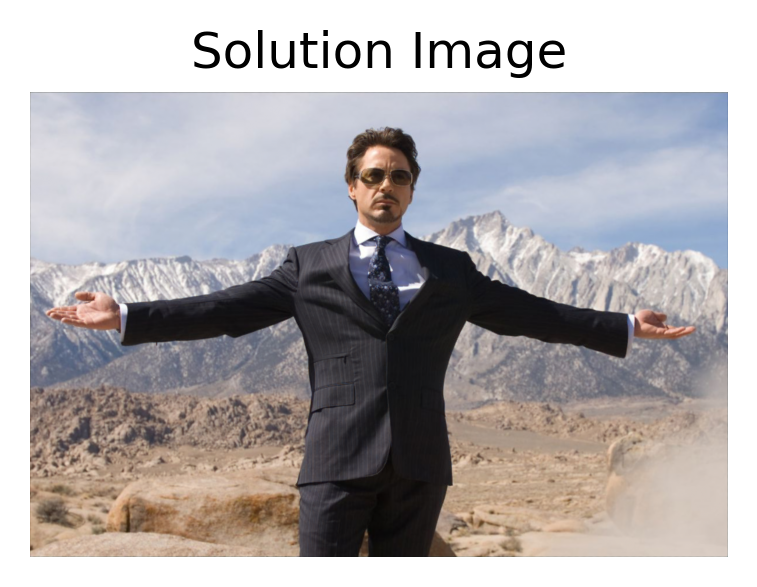

In [67]:
mosaic_img = read_image('images/tony.bmp')
soln_image = get_freeman_solution_image(mosaic_img)
original_image = read_image('images/tony.jpg')
# For sanity check display your solution image here
### YOUR CODE

fig=plt.figure(figsize=[3,3],dpi=300)
plt.imshow(soln_image)
plt.axis('off')
plt.title('Solution Image')
fig.savefig('p2_6_3.svg',format='svg')

The average per-pixel error for iceberg is: 0.0004432315876105343
The maximum per-pixel error for iceberg is: 0.49639369473279504


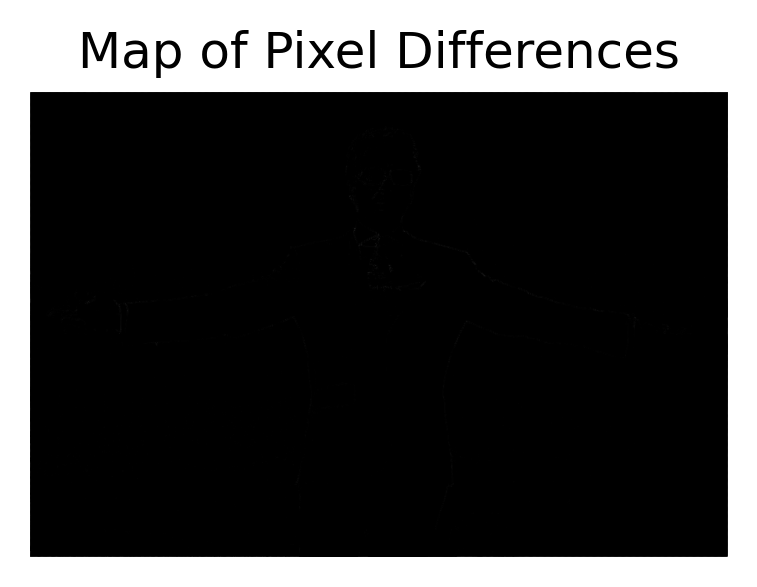

In [68]:
pp_err, max_err = compute_errors(soln_image, original_image)
print("The average per-pixel error for iceberg is: "+str(pp_err))
print("The maximum per-pixel error for iceberg is: "+str(max_err))

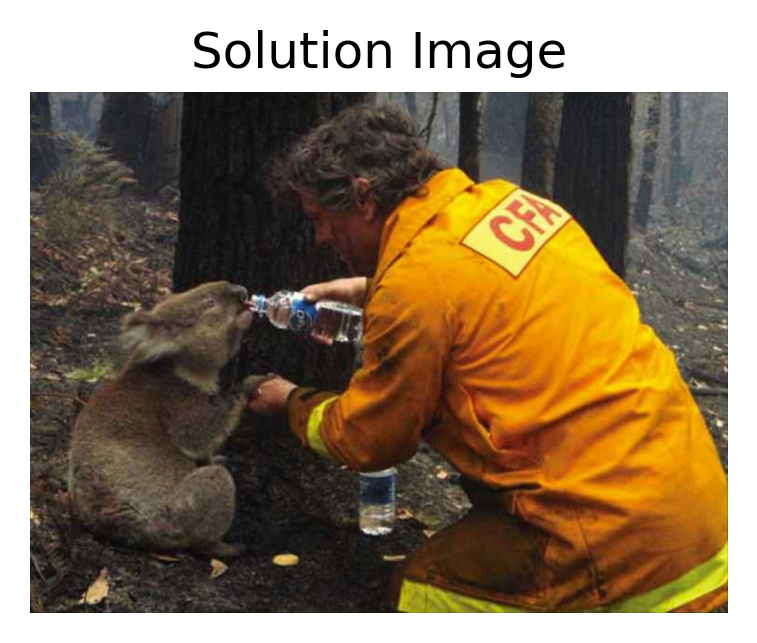

In [55]:
mosaic_img = read_image('images/hope.bmp')
soln_image = get_freeman_solution_image(mosaic_img)
# Generate your solution image here and show it

fig=plt.figure(figsize=[3,3],dpi=300)
plt.axis('off')
plt.title('Solution Image')
plt.imshow(soln_image)
fig.savefig('p2_1.svg',format='svg')

### Mosaicing an Image

Now lets take a step backwards and mosaic an image.

In [69]:
def get_mosaic_image(original_image):
    '''
    Generate the mosaic image using the Bayer Pattern.
    '''
    
    mosaic_img = np.zeros((original_image.shape[0], original_image.shape[1]))
    
    mosaic_img[0:mosaic_img.shape[0]:2,0:mosaic_img.shape[1]:2] = original_image[0:mosaic_img.shape[0]:2,0:mosaic_img.shape[1]:2,0]
    mosaic_img[0:mosaic_img.shape[0]:2,1:mosaic_img.shape[1]:2] = original_image[0:mosaic_img.shape[0]:2,1:mosaic_img.shape[1]:2,1]
    mosaic_img[1:mosaic_img.shape[0]:2,0:mosaic_img.shape[1]:2] = original_image[1:mosaic_img.shape[0]:2,0:mosaic_img.shape[1]:2,1]
    mosaic_img[1:mosaic_img.shape[0]:2,1:mosaic_img.shape[1]:2] = original_image[1:mosaic_img.shape[0]:2,1:mosaic_img.shape[1]:2,2]
    
    return mosaic_img

The average per-pixel error for tony is: 0.016910934857249735
The maximum per-pixel error for tony is: 1.3671203383314112


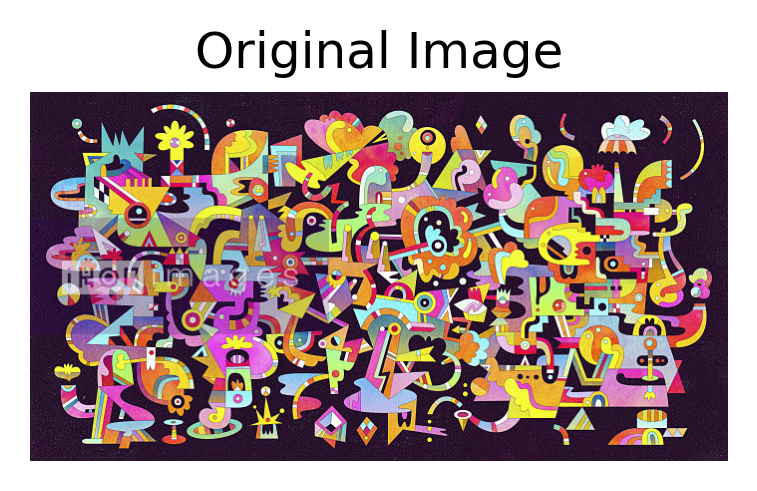

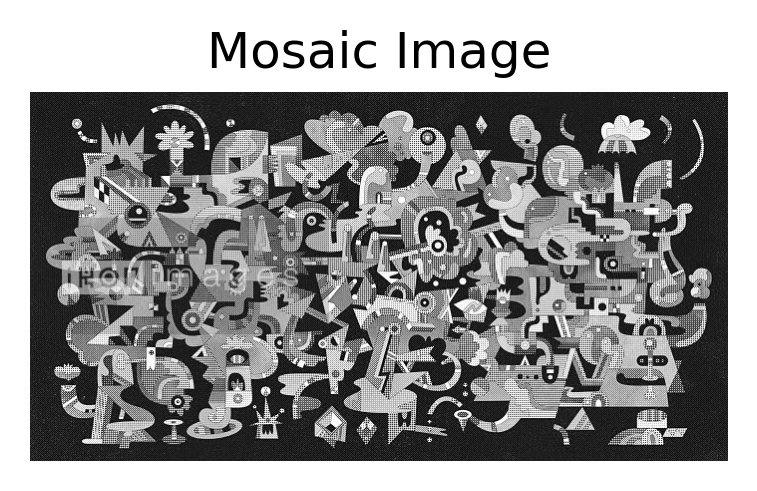

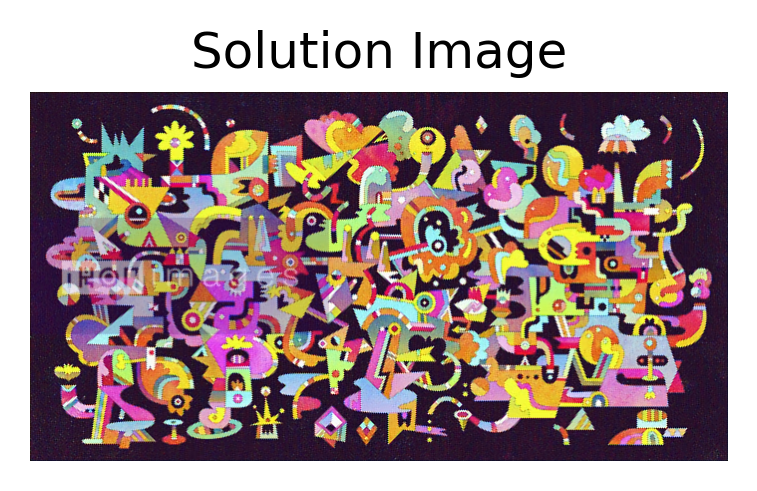

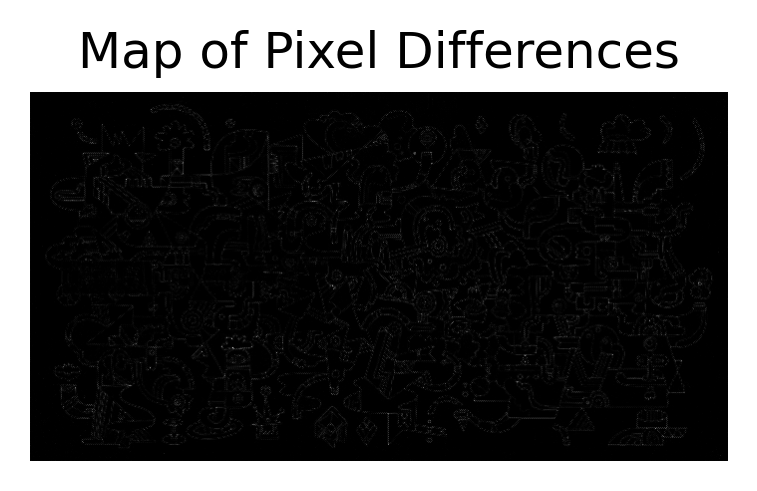

In [74]:
original_image = read_image('images/test10.jpg')
mosaic_img = get_mosaic_image(original_image)
soln_image = get_freeman_solution_image(mosaic_img)

fig1=plt.figure(figsize=[3,3],dpi=300)
plt.axis('off')
plt.title('Original Image')
plt.imshow(original_image)
fig1.savefig('p3_2_1.svg',format='svg')

fig2=plt.figure(figsize=[3,3],dpi=300)
plt.axis('off')
plt.title('Mosaic Image')
plt.imshow(mosaic_img, cmap='gray')
# fig2.savefig('p3_2_2.svg',format='svg')

fig3=plt.figure(figsize=[3,3],dpi=300)
plt.axis('off')
plt.title('Solution Image')
plt.imshow(soln_image)
fig3.savefig('p3_2_2.svg',format='svg')

pp_err, max_err = compute_errors(soln_image, original_image)
print("The average per-pixel error for tony is: "+str(pp_err))
print("The maximum per-pixel error for tony is: "+str(max_err))

The average per-pixel error for tony is: 0.021798006013881297
The maximum per-pixel error for tony is: 0.9827412533640907


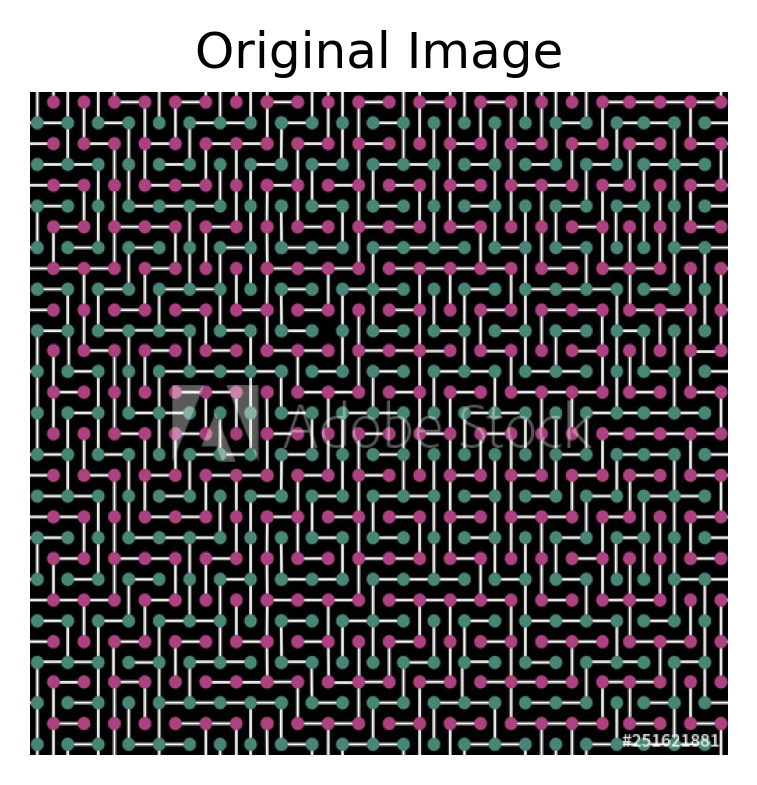

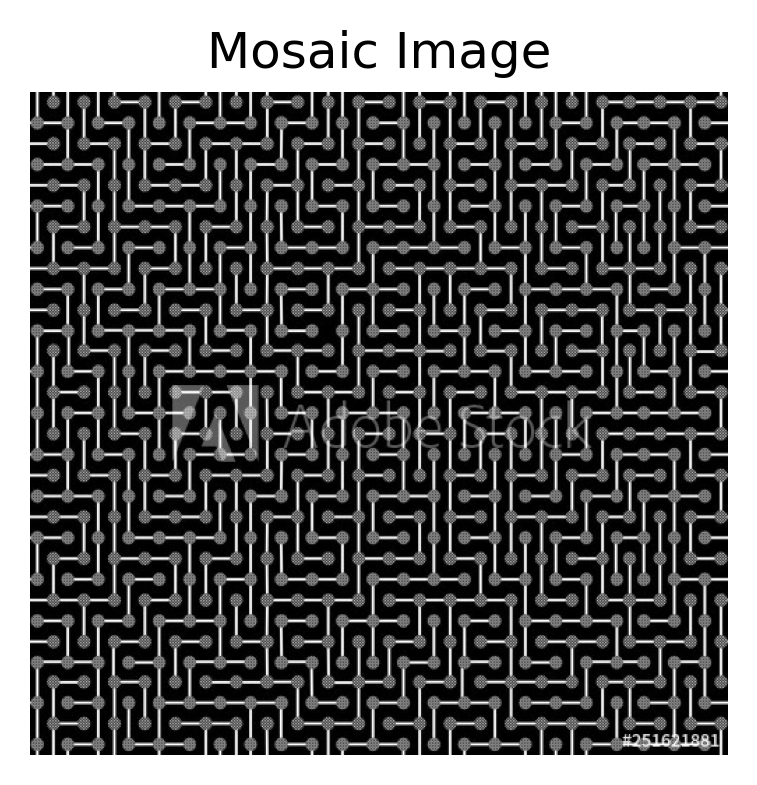

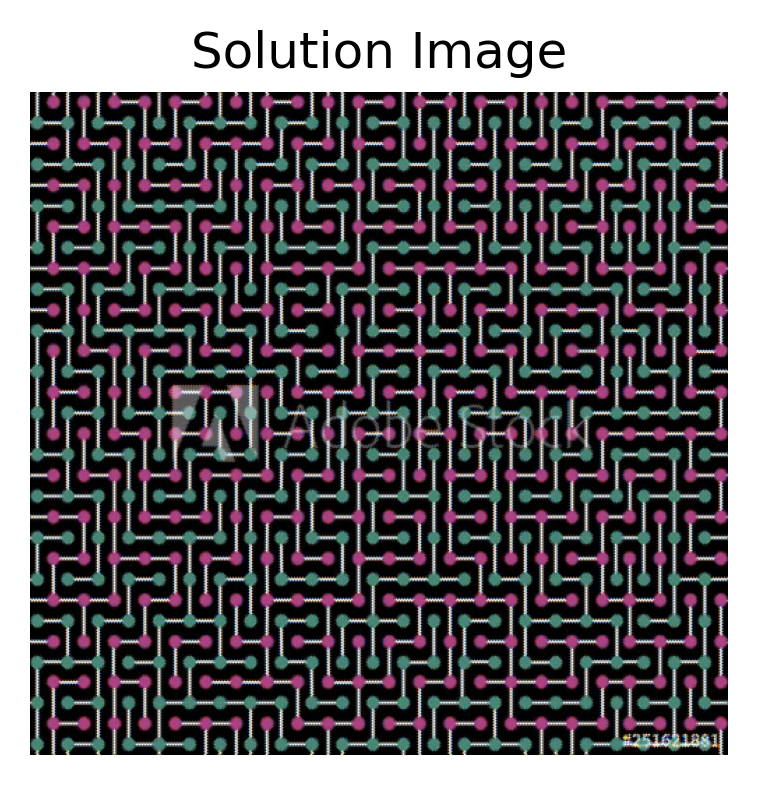

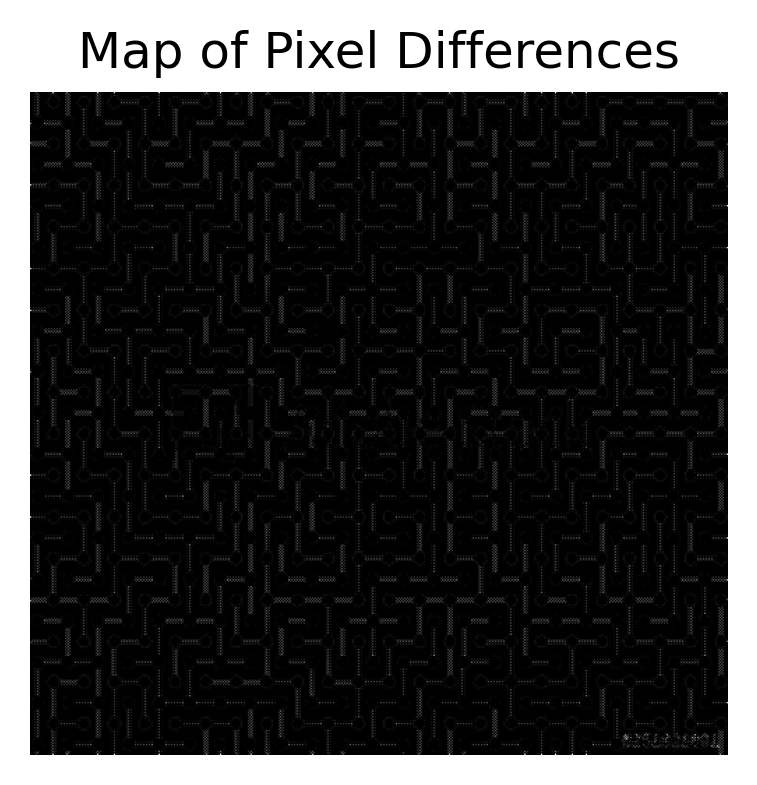

In [72]:
original_image = read_image('images/test7.jpg')
mosaic_img = get_mosaic_image(original_image)
soln_image = get_freeman_solution_image(mosaic_img)

fig1=plt.figure(figsize=[3,3],dpi=300)
plt.axis('off')
plt.title('Original Image')
plt.imshow(original_image)
fig1.savefig('p3_1_1.svg',format='svg')

fig2=plt.figure(figsize=[3,3],dpi=300)
plt.axis('off')
plt.title('Mosaic Image')
plt.imshow(mosaic_img, cmap='gray')
# fig2.savefig('p3_ck4.svg',format='svg')

fig3=plt.figure(figsize=[3,3],dpi=300)
plt.axis('off')
plt.title('Solution Image')
plt.imshow(soln_image)
fig3.savefig('p3_1_2.svg',format='svg')

pp_err, max_err = compute_errors(soln_image, original_image)
print("The average per-pixel error for tony is: "+str(pp_err))
print("The maximum per-pixel error for tony is: "+str(max_err))

The average per-pixel error for tony is: 0.011328194071357107
The maximum per-pixel error for tony is: 0.9013052672049212


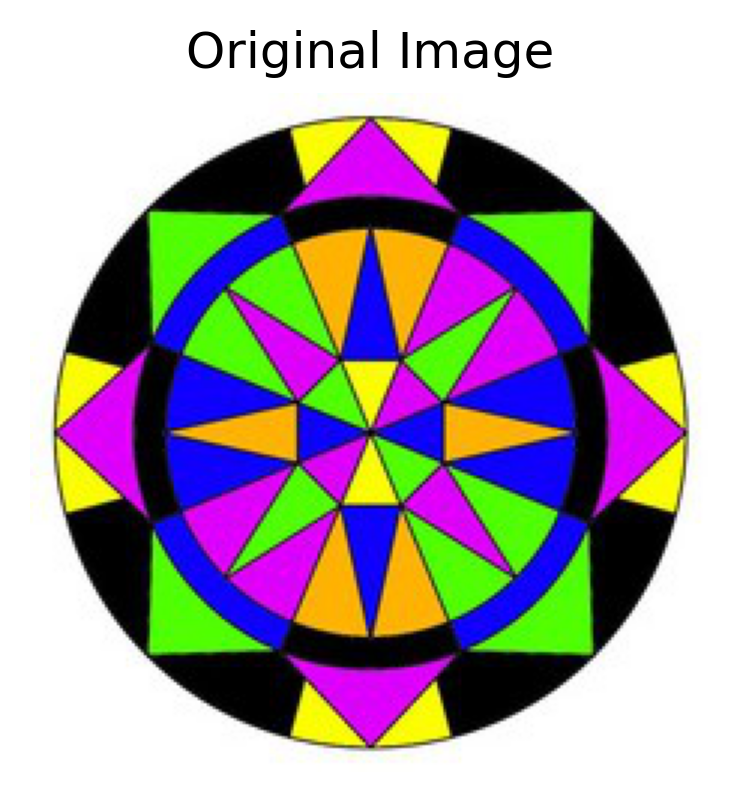

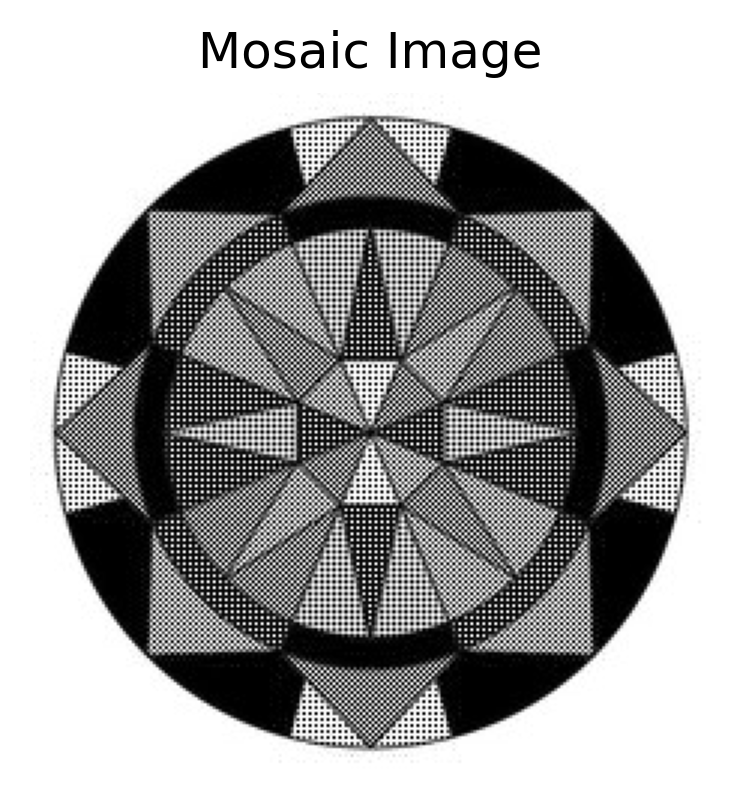

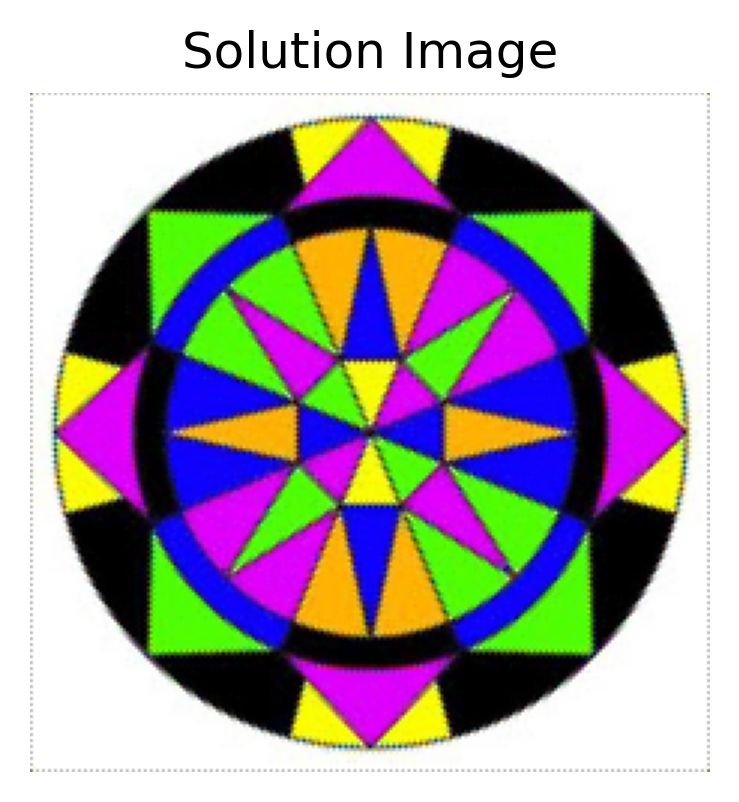

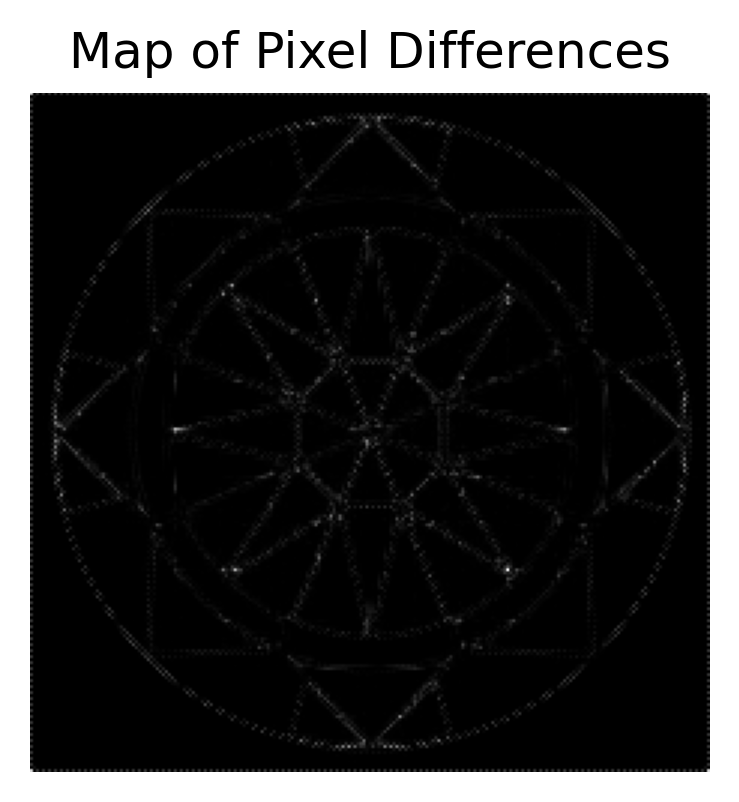

In [73]:
original_image = read_image('images/test6.jpg')
mosaic_img = get_mosaic_image(original_image)
soln_image = get_freeman_solution_image(mosaic_img)

fig1=plt.figure(figsize=[3,3],dpi=300)
plt.axis('off')
plt.title('Original Image')
plt.imshow(original_image)
fig1.savefig('p3_1_3.svg',format='svg')

fig=plt.figure(figsize=[3,3],dpi=300)
plt.axis('off')
plt.title('Mosaic Image')
plt.imshow(mosaic_img, cmap='gray')
# fig.savefig('p3_ck4.svg',format='svg')

fig2=plt.figure(figsize=[3,3],dpi=300)
plt.axis('off')
plt.title('Solution Image')
plt.imshow(soln_image)
fig2.savefig('p3_1_4.svg',format='svg')

pp_err, max_err = compute_errors(soln_image, original_image)
print("The average per-pixel error for tony is: "+str(pp_err))
print("The maximum per-pixel error for tony is: "+str(max_err))

### Practive with image operations


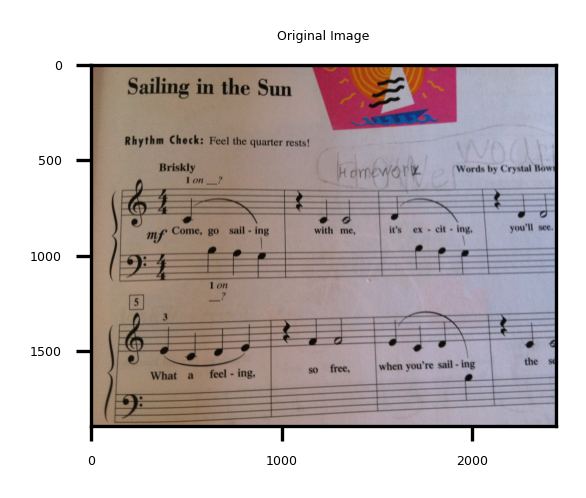

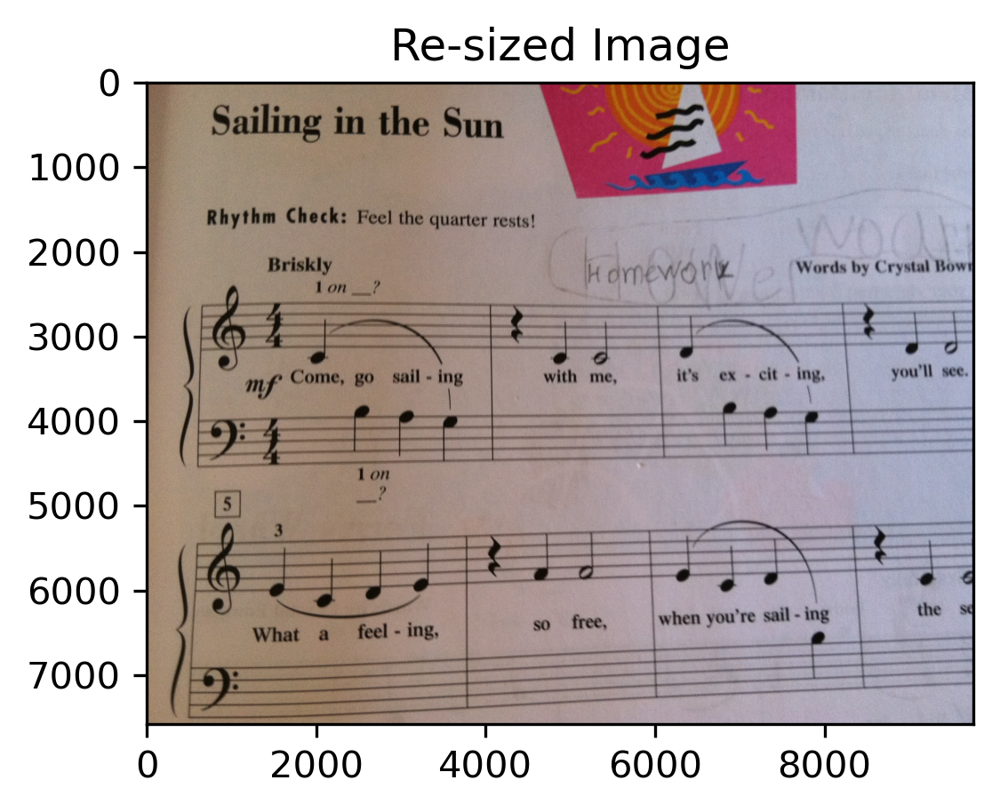

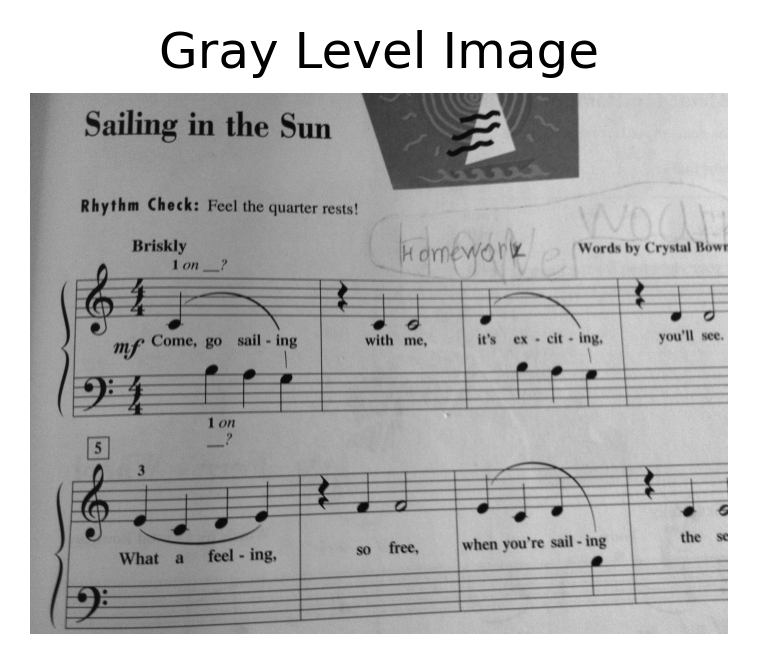

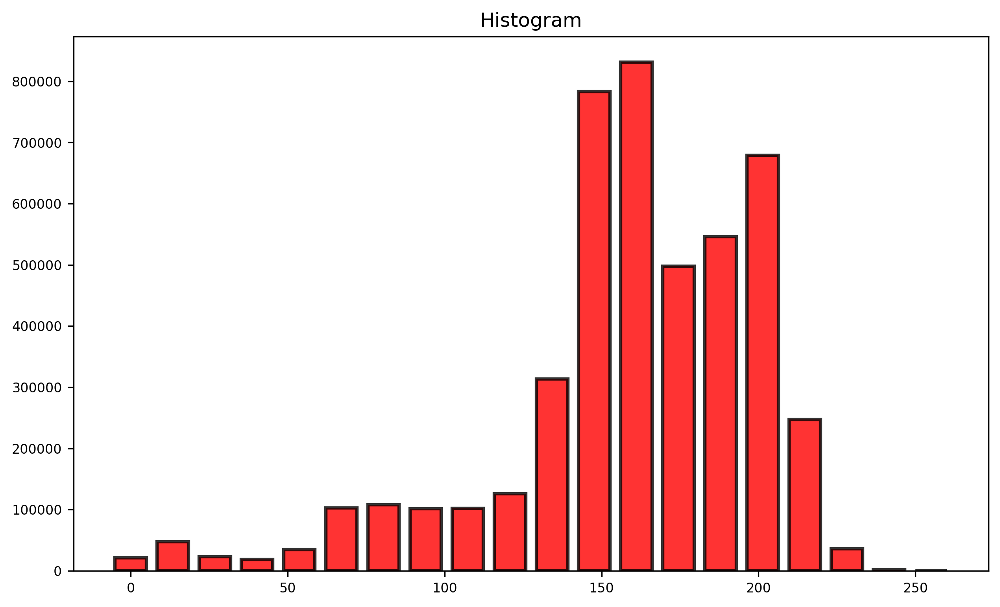

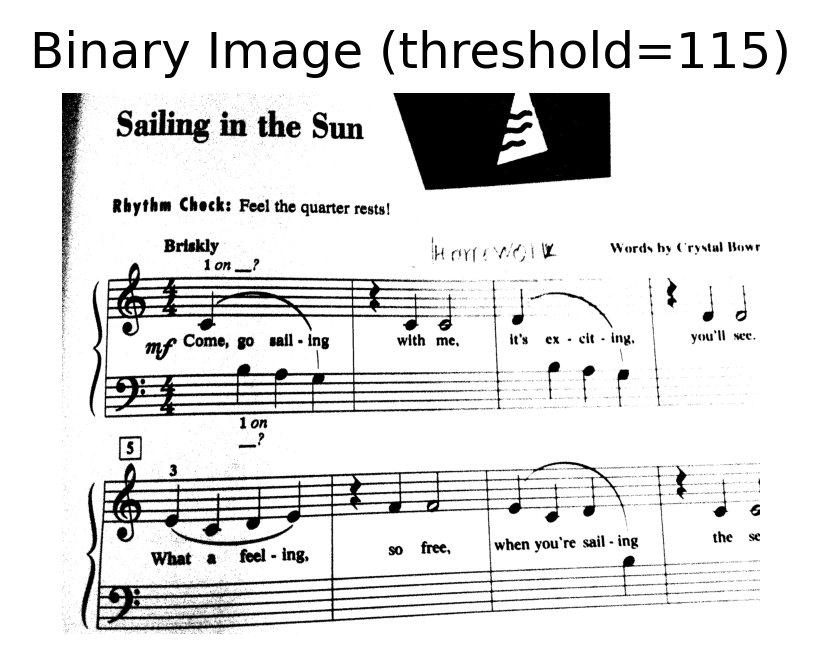

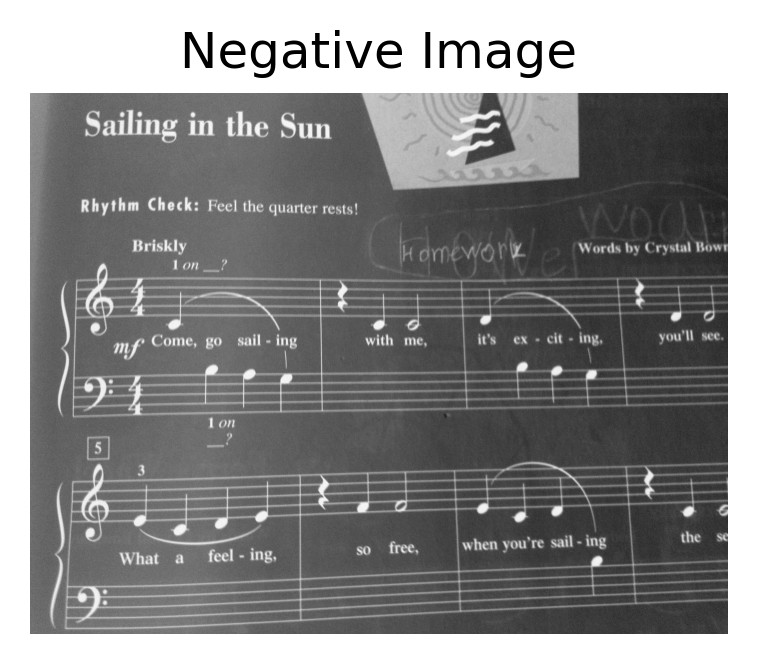

In [8]:
f = 4
image = read_image('images/notes_color.jpg')

image_resize = cv2.resize(image, (f*image.shape[1],f*image.shape[0]))

gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

hist, bin_edges = np.histogram(gray,bins=20, density=False)

binary_image = np.zeros(gray.shape)
binary_image[gray >= 115] = 255
binary_image[gray < 115] = 0

negative_image = 255 - gray

fig1=plt.figure(figsize=[2,2],dpi=300)
plt.title('Original Image', fontsize=3)
plt.imshow(image)
plt.xticks(fontsize=3)
plt.yticks(fontsize=3)
fig1.savefig('p4_1.svg',format='svg')

fig2=plt.figure(figsize=[4,4],dpi=300)
plt.title('Re-sized Image')
plt.imshow(image_resize)
fig2.savefig('p4_2.svg',format='svg')

fig3=plt.figure(figsize=[3,3],dpi=300)
plt.axis('off')
plt.title('Gray Level Image')
plt.imshow(gray, cmap='gray')
fig3.savefig('p4_3.svg',format='svg')

fig4=plt.figure(figsize=[10,6],dpi=300)
plt.bar(np.linspace(0,255,20), hist, alpha=0.8, width=10,facecolor='r', edgecolor='black',linewidth=2)
plt.xticks(fontsize=8)
plt.yticks(fontsize=8)
plt.title('Histogram')
plt.show()
fig4.savefig('p4_4.svg',format='svg')

fig5=plt.figure(figsize=[3,3],dpi=300)
plt.axis('off')
plt.title('Binary Image (threshold=115)')
plt.imshow(binary_image, cmap='gray')
fig5.savefig('p4_5.svg',format='svg')

fig6=plt.figure(figsize=[3,3],dpi=300)
plt.axis('off')
plt.title('Negative Image')
plt.imshow(negative_image, cmap='gray')
fig6.savefig('p4_6.svg',format='svg')